In [1]:
rm(list=ls())
library(MAST)
library(scran)
library(scds)
library(scDblFinder)
library(Seurat)
library(Matrix)
library(cowplot) 
library(gridExtra)
library(dplyr)
library(clustree)
library(DT)
library(pheatmap)
library(RColorBrewer)
library(gplots)
library(pracma)
library(monocle)
library(corrplot)
options(mc.cores = 32)

Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: GenomicRanges

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: 'BiocGenerics'


The following objects are masked from 'package:parallel':

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from 'package:stats':

    IQR, mad, sd, var, xtabs


The following objects are masked from 'package:base':

    Filter, Find, Map, Position, Reduce, anyDuplicated, append,
    as.data.frame, basename, cbind, colnames, dirname, do.call,
    duplicated, eval, evalq, get, grep, grepl, intersect, is.unsorted,
    lapply, mapply, match, mget, order, paste, pmax, pmax.int, pmin,
    pmin.int, rank, rbind, rownames, sapply, setdiff, sort, table,
   

<h2>1.Read multiple Seurat data (4 CL10) and merger into one object </h2>

In [2]:
data_list <- c("CL15P", "CL15D4", "CL15D7","CL15D14")
sc.list <- lapply(data_list, function(v){readRDS(paste0('/mnt/isilonX200/scRNA/Project_1/Result/', v,'.qc.Rds'))})

In [3]:
color_style = c("CL1-5-P-4" = "#14c770", "CL1-5-D4" = "#f5c242", "CL1-5-D7" = "#e86b5d", "CL1-5-D14" = "#54d1cd")
order_list = c("CL1-5-P-4","CL1-5-D4","CL1-5-D7","CL1-5-D14")

In [4]:
names(sc.list) <- data_list
sapply(sc.list, dim)

CL15P,CL15D4,CL15D7,CL15D14
33538,33538,33538,33538
4486,3895,3102,5224


In [5]:
sc.list

$CL15P
An object of class Seurat 
67076 features across 4486 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM

$CL15D4
An object of class Seurat 
67076 features across 3895 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM

$CL15D7
An object of class Seurat 
67076 features across 3102 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM

$CL15D14
An object of class Seurat 
67076 features across 5224 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM


In [6]:
scdata <- merge(sc.list[[1]], y = c(sc.list[[2]], sc.list[[3]], sc.list[[4]]))

In [7]:
scdata$condition <- factor(scdata$condition, levels = order_list, ordered = TRUE)
scdata

An object of class Seurat 
67076 features across 16707 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM

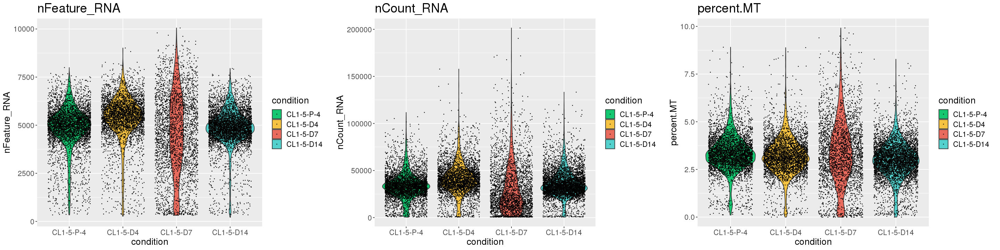

In [8]:
options(repr.plot.width=24, repr.plot.height=6)
vgp1 <- ggplot(scdata[[]], aes(x=condition, y=nFeature_RNA, fill=condition))+
        geom_violin()+
        geom_point(position="jitter", size=0.1)+
        theme(text = element_text(size = 16), plot.title = element_text(size=22))+
        scale_fill_manual(values = color_style)+
        labs(title = "nFeature_RNA")
vgp2 <- ggplot(scdata[[]], aes(x=condition, y=nCount_RNA, fill=condition))+
        geom_violin()+
        geom_point(position="jitter", size=0.1)+
        theme(text = element_text(size = 16), plot.title = element_text(size=22))+
        scale_fill_manual(values = color_style)+
        labs(title = "nCount_RNA")
vgp3 <- ggplot(scdata[[]], aes(x=condition, y=percent.MT, fill=condition))+
        geom_violin()+
        geom_point(position="jitter", size=0.1)+
        theme(text = element_text(size = 16), plot.title = element_text(size=22))+
        scale_fill_manual(values = color_style)+
        labs(title = "percent.MT")
plot_grid(vgp1, vgp2, vgp3, ncol=3)

In [9]:
ncells <- rowSums(GetAssayData(scdata, assay = 'RNA', slot = 'data') > 0)
scdata <- scdata[ncells > 15, ]
scdata
saveRDS(scdata, file = '/mnt/isilonX200/scRNA/Project_1/Result/CL15.merge.noc.Rds')

An object of class Seurat 
38204 features across 16707 samples within 2 assays 
Active assay: RNA (19102 features, 0 variable features)
 1 other assay present: logCPM

<h2>2.Normalization (logCPM)</h2>

In [10]:
scdata <- readRDS(file = '/mnt/isilonX200/scRNA/Project_1/Result/CL15.merge.noc.Rds')

In [11]:
scdata.count <- scdata
scdata <- NormalizeData(scdata)
scdata <- RenameAssays(scdata, RNA = 'logCPM')# GetAssayData(scdata, assay = 'logCPM', slot = 'data')[1:15,1:3]
scdata@assays$Count <- scdata.count@assays$RNA # scdata@active.assay <- 'logCPM'
scdata

Renaming default assay from RNA to logCPM



An object of class Seurat 
38204 features across 16707 samples within 2 assays 
Active assay: logCPM (19102 features, 0 variable features)
 1 other assay present: Count

In [12]:
str(scdata)

Formal class 'Seurat' [package "Seurat"] with 12 slots
  ..@ assays      :List of 2
  .. ..$ logCPM:Formal class 'Assay' [package "Seurat"] with 8 slots
  .. .. .. ..@ counts       :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i       : int [1:82556845] 6 11 12 13 18 22 25 28 30 37 ...
  .. .. .. .. .. ..@ p       : int [1:16708] 0 4767 9612 14198 19313 25491 30321 35078 39090 44163 ...
  .. .. .. .. .. ..@ Dim     : int [1:2] 19102 16707
  .. .. .. .. .. ..@ Dimnames:List of 2
  .. .. .. .. .. .. ..$ : chr [1:19102] "AL627309.1" "AL669831.5" "LINC00115" "FAM41C" ...
  .. .. .. .. .. .. ..$ : chr [1:16707] "AAACCTGAGTGTACTC-1-CL1-5-P-4" "AAACCTGCAATTGCTG-1-CL1-5-P-4" "AAACCTGCACCTGGTG-1-CL1-5-P-4" "AAACCTGGTAGGGACT-1-CL1-5-P-4" ...
  .. .. .. .. .. ..@ x       : num [1:82556845] 3 4 4 2 3 3 1 2 20 1 ...
  .. .. .. .. .. ..@ factors : list()
  .. .. .. ..@ data         :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i      

<h2>3.Highly variable genes (vst, top4000)</h2>

In [13]:
scdata <- FindVariableFeatures(scdata, selection.method = "vst", nfeatures = 4000)

Warning message:
"Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session."


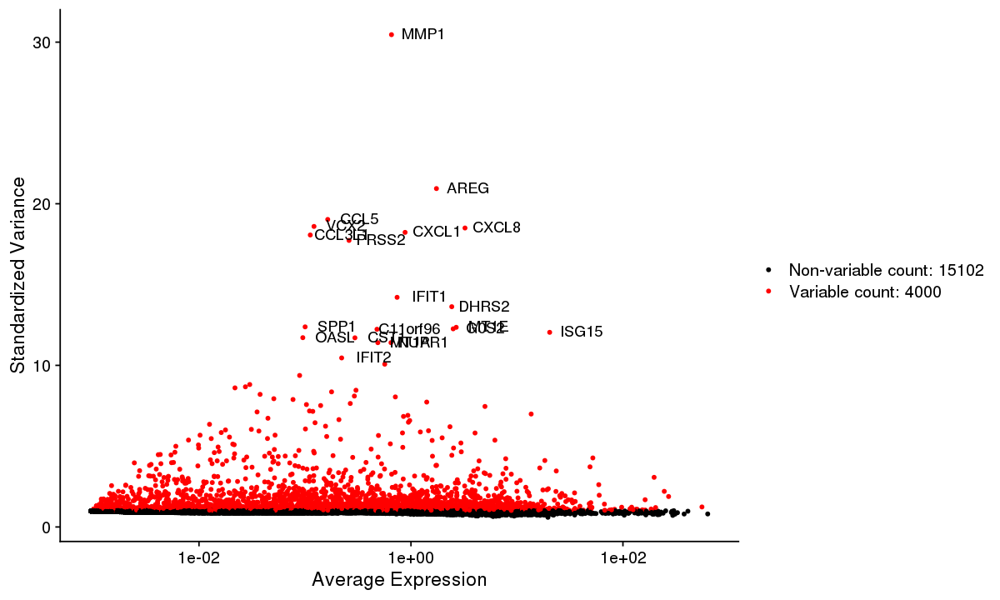

In [14]:
options(repr.plot.width = 10, repr.plot.height = 6)
LabelPoints(plot = VariableFeaturePlot(scdata), points = head(VariableFeatures(scdata), 20))

<h2>4.Dimension reduction: PCA (Scaled data: mean 0 and sd 1;Correction : cellcycle effect, technical effect)</h2>

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



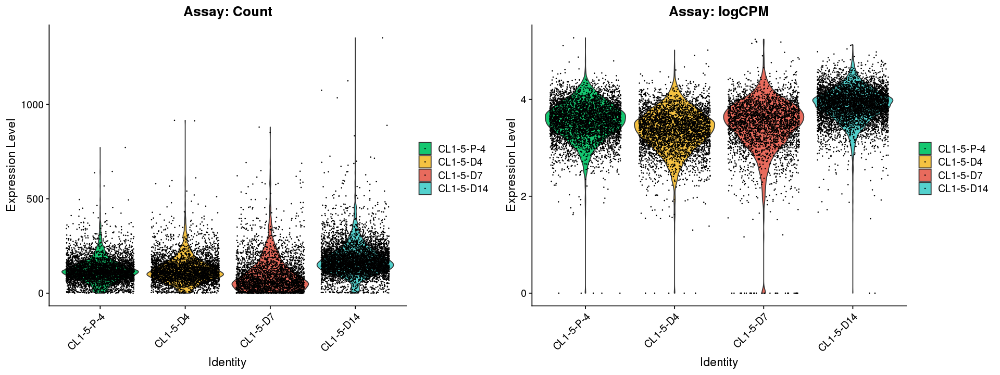

In [15]:
options(repr.plot.width=16, repr.plot.height=6)
MT2A_vp1 <- VlnPlot(scdata, 'LGALS1', assay = "Count", pt.size = 0.1, group.by = 'condition', col = brewer.pal(5, 'Dark2'))+
                    scale_fill_manual(values = color_style)+
                    labs(title = "Assay: Count")
MT2A_vp2 <- VlnPlot(scdata, 'LGALS1', assay = "logCPM", pt.size = 0.1, group.by = 'condition', col = brewer.pal(5, 'Dark2'))+
                    scale_fill_manual(values = color_style)+
                    labs(title = "Assay: logCPM")
plot_grid(MT2A_vp1, MT2A_vp2, ncol=2)

In [16]:
#################################### CellCycle ################################################
scdata <- CellCycleScoring(object = scdata, assay = 'logCPM',
                           g2m.features = cc.genes.updated.2019$g2m.genes, 
                           s.features = cc.genes.updated.2019$s.genes)
################################# Remove CellCycle ################################################
scdata$logCount_logCPM <- log(scdata$nCount_logCPM + 1)
scdata$logpercent.MT <- log(scdata$percent.MT + 1)
scdata <- ScaleData(object = scdata, do.scale = FALSE, verbose = FALSE,
                   vars.to.regress = c('logCount_logCPM', 'logpercent.MT', 'S.Score', 'G2M.Score'))

In [17]:
scdata <- RunPCA(object = scdata, features = VariableFeatures(scdata), verbose = FALSE, assay = 'logCPM', npcs = 100, reduction.name = 'pca')

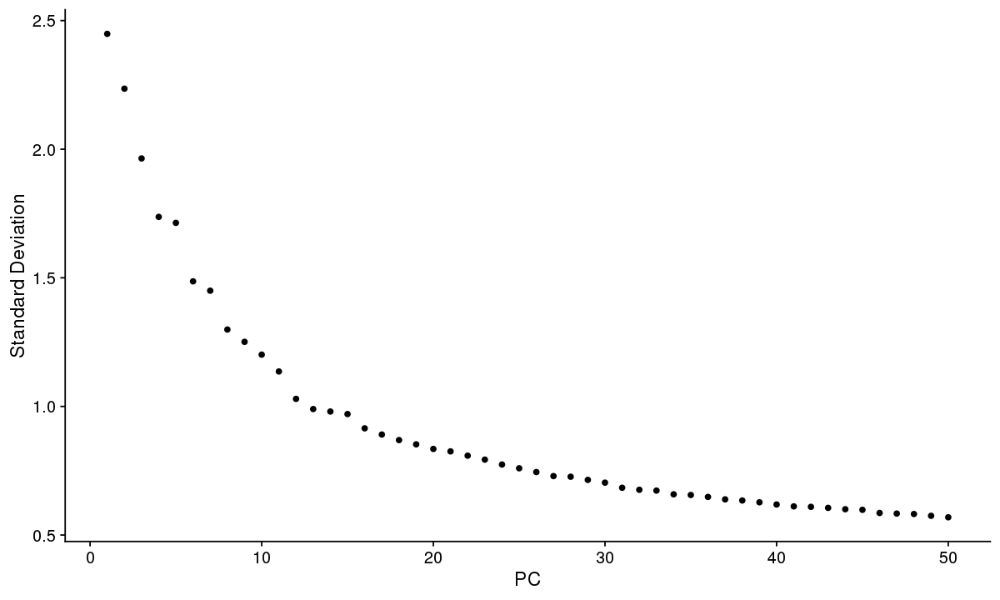

In [18]:
options(repr.plot.width=10, repr.plot.height=6)
ElbowPlot(scdata, ndims = 50)

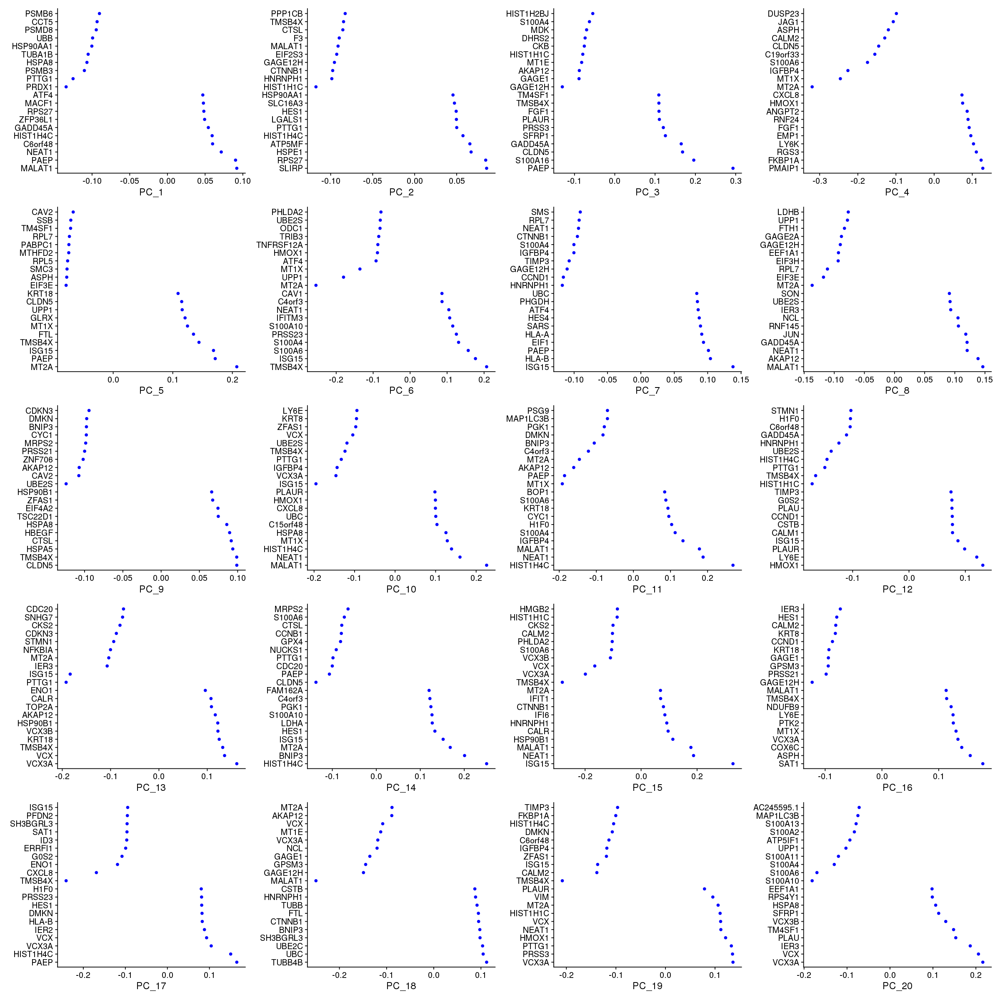

In [19]:
options(repr.plot.width = 20, repr.plot.height = 20)
VizDimLoadings(scdata, dims = 1:20, reduction = "pca", nfeatures = 20, balanced = TRUE, ncol = 4)

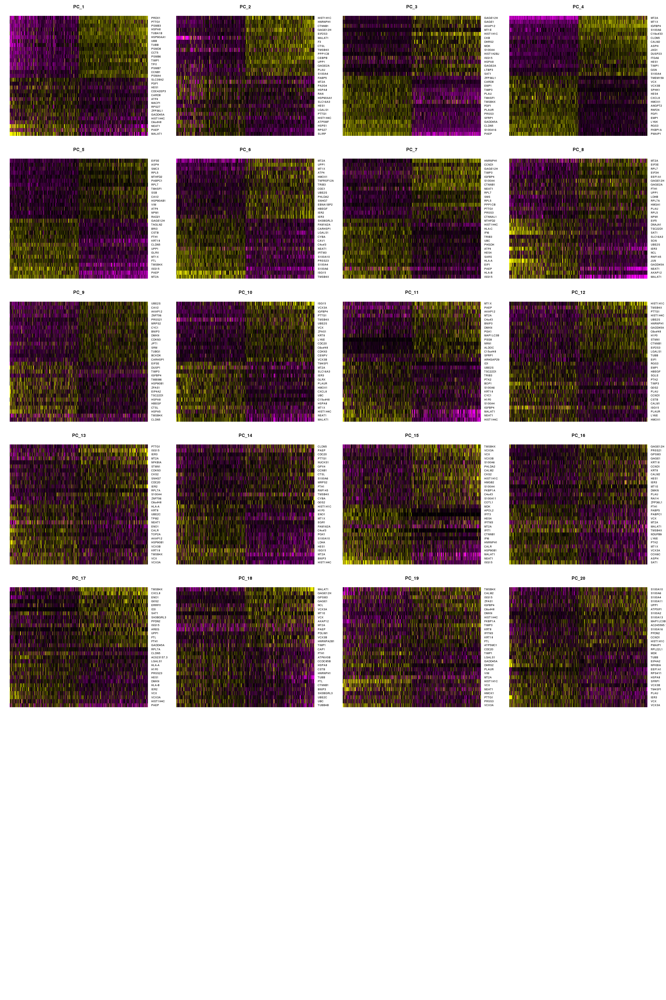

In [20]:
options(repr.plot.width = 20, repr.plot.height = 30)
DimHeatmap(scdata, dims = 1:20, cells = 500, reduction = "pca", balanced = TRUE, ncol = 4)


Attaching package: 'future'


The following object is masked from 'package:SummarizedExperiment':

    values


The following object is masked from 'package:GenomicRanges':

    values


The following object is masked from 'package:IRanges':

    values


The following object is masked from 'package:S4Vectors':

    values


Warning message:
"Removed 305258 rows containing missing values (geom_point)."


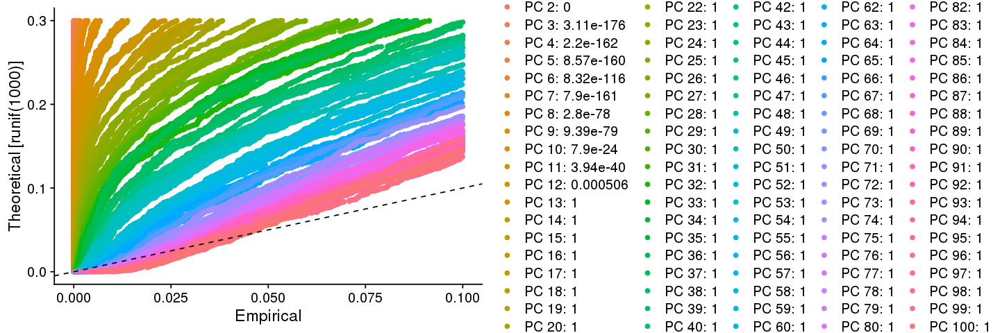

In [21]:
library(future)
plan("multiprocess", workers = 64)
options(repr.plot.width=12, repr.plot.height=4)
scdata <- JackStraw(scdata, num.replicate = 300, dims = 100)
scdata <- ScoreJackStraw(scdata, dims = 1:100)
JackStrawPlot(scdata, dims = 1:100)

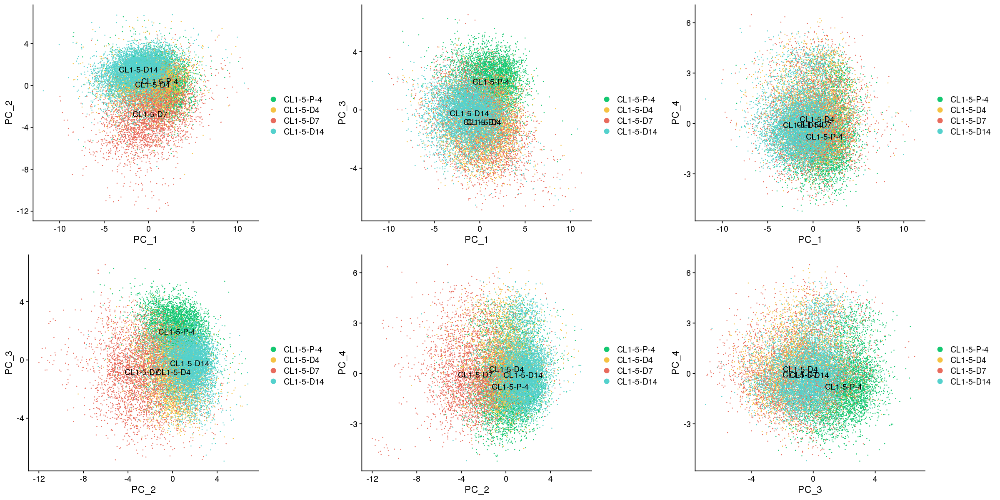

In [22]:
options(repr.plot.width = 20, repr.plot.height = 10)
pcc1 <- DimPlot(object = scdata, reduction = "pca", dims = c(1, 2), group.by = "condition", label = TRUE, cols = color_style)
pcc2 <- DimPlot(object = scdata, reduction = "pca", dims = c(1, 3), group.by = "condition", label = TRUE, cols = color_style)
pcc3 <- DimPlot(object = scdata, reduction = "pca", dims = c(1, 4), group.by = "condition", label = TRUE, cols = color_style)
pcc4 <- DimPlot(object = scdata, reduction = "pca", dims = c(2, 3), group.by = "condition", label = TRUE, cols = color_style)
pcc5 <- DimPlot(object = scdata, reduction = "pca", dims = c(2, 4), group.by = "condition", label = TRUE, cols = color_style)
pcc6 <- DimPlot(object = scdata, reduction = "pca", dims = c(3, 4), group.by = "condition", label = TRUE, cols = color_style)
plot_grid(pcc1, pcc2, pcc3, pcc4, pcc5, pcc6, ncol = 3)

<h2>5.Cell Cycle</h2>

In [23]:
# scdata <- CellCycleScoring(object = scdata, assay = 'logCPM',
#                            g2m.features = cc.genes.updated.2019$g2m.genes, 
#                            s.features = cc.genes.updated.2019$s.genes)

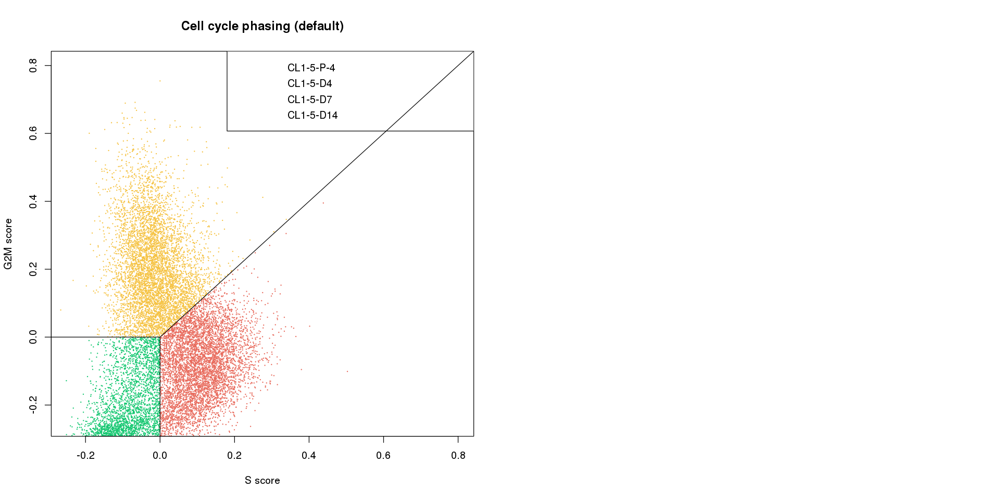

In [23]:
options(repr.plot.width = 16, repr.plot.height = 8)
par(mfrow = c(1, 2))
plot(cbind(scdata$S.Score, scdata$G2M.Score),
     cex = 0.2, pch = 20, xlab = 'S score', ylab = 'G2M score', main = 'Cell cycle phasing (default)', xlim = c(-0.25, 0.8), ylim = c(-0.25, 0.8),
     col = color_style[factor(scdata$Phase)])
legend("topright", legend=order_list, col = color_style)
rect(-10, -10, 0, 0)
segments(0, 0, 1, 1)

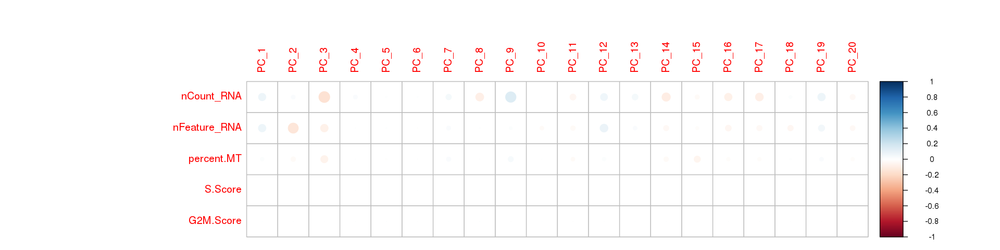

In [24]:
options(repr.plot.width = 16, repr.plot.height = 4)
cor.pca.meta <- cor(scdata@reductions$pca@cell.embeddings[, 1:20], scdata@meta.data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score')])#, method = 'spear')
corrplot(t(cor.pca.meta), method = "circle")

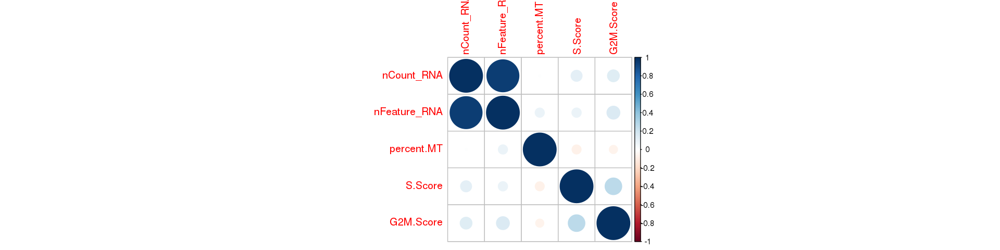

In [25]:
options(repr.plot.width = 16, repr.plot.height = 4)
cor.meta <- cor(scdata@meta.data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score')], scdata@meta.data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score')], method = 'spear')
corrplot(cor.meta, method = "circle")

In [27]:
# saveRDS(scdata, file = '/mnt/isilonX200/scRNA/Project_1/Result/CL15.merge.noc.Rds')

In [26]:
head(scdata[[]])

,orig.ident,nCount_RNA,nFeature_RNA,condition,percent.MT,nCount_logCPM,nFeature_logCPM,S.Score,G2M.Score,Phase,logCount_logCPM,logpercent.MT
,<chr>,<dbl>,<int>,<ord>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>
AAACCTGAGTGTACTC-1-CL1-5-P-4,Project_1,30550,4767,CL1-5-P-4,3.521980,30550,4767,-0.11837637,-0.32486084,G1,10.32715,1.508950
AAACCTGCAATTGCTG-1-CL1-5-P-4,Project_1,32269,4845,CL1-5-P-4,2.717779,32269,4845,-0.02128116,0.29019603,G2M,10.38189,1.313126
AAACCTGCACCTGGTG-1-CL1-5-P-4,Project_1,28982,4586,CL1-5-P-4,2.235871,28982,4586,-0.08761361,-0.15206221,G1,10.27446,1.174298
AAACCTGGTAGGGACT-1-CL1-5-P-4,Project_1,35768,5115,CL1-5-P-4,3.351784,35768,5115,0.12985950,-0.01364067,S,10.48484,1.470586
AAACCTGGTCACTGGC-1-CL1-5-P-4,Project_1,58323,6178,CL1-5-P-4,2.839311,58323,6178,0.06562896,0.31463233,G2M,10.97377,1.345293
AAACCTGGTGCCTGCA-1-CL1-5-P-4,Project_1,30449,4830,CL1-5-P-4,4.016157,30449,4830,0.11428975,-0.01317084,S,10.32384,1.612664


<h2>6.Visualization: tSNE, UMAP</h>

In [27]:
pc <- 20
scdata <- RunUMAP(scdata, reduction = "pca", dims = 1:pc)
scdata <- RunTSNE(scdata, reduction = "pca", dims = 1:pc, max_iter = 2000)

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
16:41:11 UMAP embedding parameters a = 0.9922 b = 1.112

16:41:11 Read 16707 rows and found 20 numeric columns

16:41:11 Using Annoy for neighbor search, n_neighbors = 30

16:41:11 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

16:41:15 Writing NN index file to temp file /tmp/RtmpAhiFZr/file6fe52185bf11

16:41:15 Searching Annoy index using 64 threads, search_k = 3000

16:41:15 Annoy recall = 100%

16:41:17 Commencing smooth kNN distance calibration using 64 threads

16:41:20 Initializi

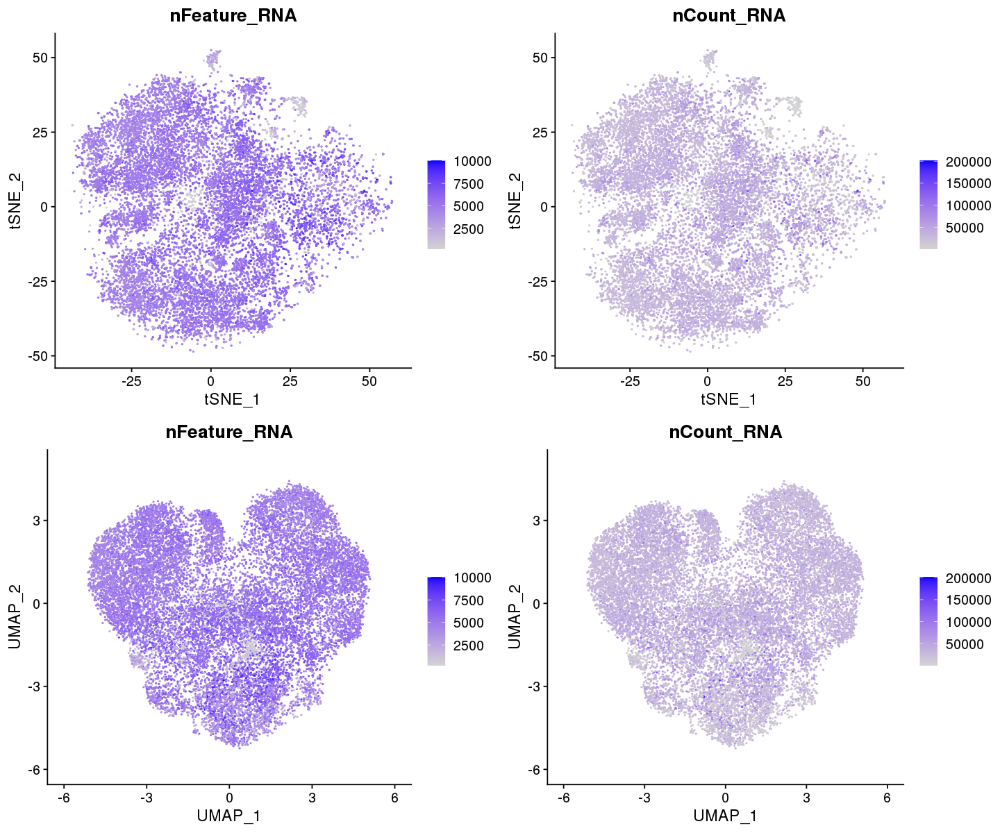

In [28]:
options(repr.plot.width=12, repr.plot.height=10)
fp1 <- FeaturePlot(scdata, features = "nFeature_RNA", pt.size = 0.25, reduction = "tsne")
fp2 <- FeaturePlot(scdata, features = "nCount_RNA", pt.size = 0.25, reduction = "tsne")
fp3 <- FeaturePlot(scdata, features = "nFeature_RNA", pt.size = 0.25, reduction = "umap")
fp4 <- FeaturePlot(scdata, features = "nCount_RNA", pt.size = 0.25, reduction = "umap")
plot_grid(fp1, fp2, fp3, fp4, ncol = 2, nrow = 2)

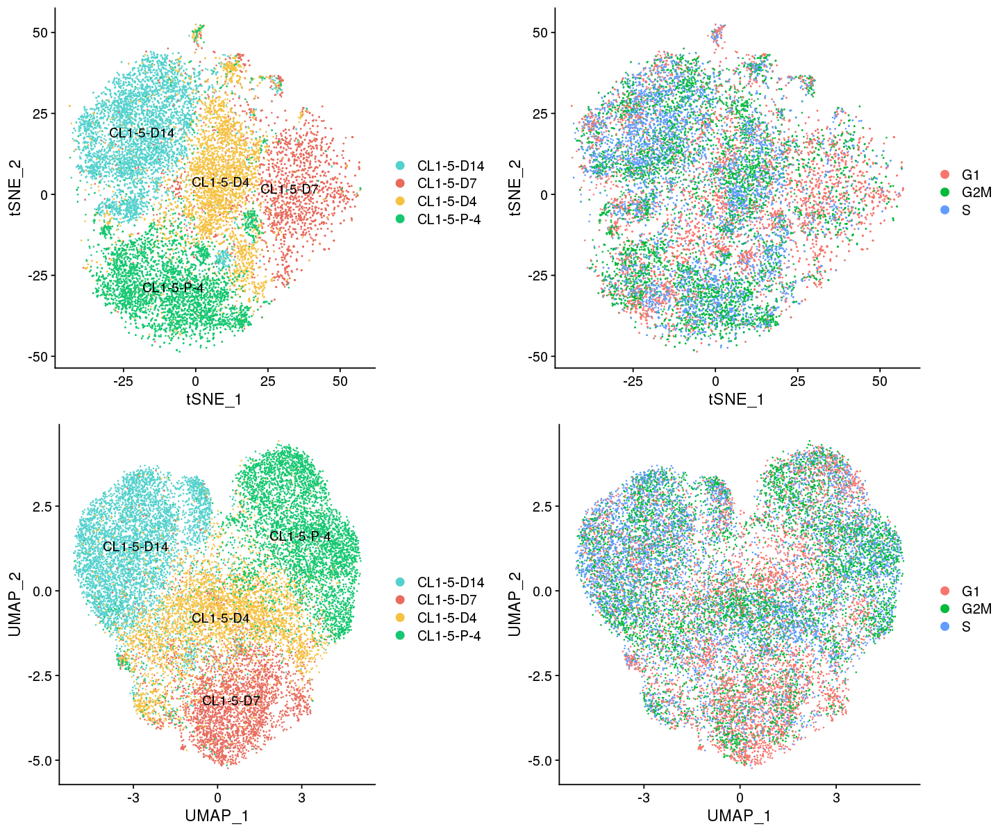

In [29]:
options(repr.plot.width=12, repr.plot.height=10)
tp1 <- DimPlot(object = scdata, reduction = "tsne", group.by = "condition", order = order_list, label = TRUE, cols = color_style)
tp2 <- DimPlot(object = scdata, reduction = "tsne", group.by = "Phase")
up1 <- DimPlot(object = scdata, reduction = "umap", group.by = "condition", order = order_list, label = TRUE, cols = color_style)
up2 <- DimPlot(object = scdata, reduction = "umap", group.by = "Phase") 
plot_grid(tp1, tp2, up1, up2, ncol=2)

### Resolution

In [30]:
resolutions <- seq(0, 1.2, 0.1) 
pc <- 12

In [31]:
scdata <- FindNeighbors(object = scdata, reduction = "pca", dims = 1:pc)
scdata <- FindClusters(scdata, resolution = resolutions)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16707
Number of edges: 463611

Running Louvain algorithm...
Maximum modularity in 10 random starts: 1.0000
Number of communities: 1
Elapsed time: 2 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16707
Number of edges: 463611

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9139
Number of communities: 4
Elapsed time: 3 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16707
Number of edges: 463611

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8803
Number of communities: 6
Elapsed time: 2 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16707
Number of edges: 463611

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8565
Number of communities: 8
Elapsed time: 2 seconds
Modularity Optim

In [32]:
head(scdata@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,condition,percent.MT,nCount_logCPM,nFeature_logCPM,S.Score,G2M.Score,Phase,...,logCPM_snn_res.0.4,logCPM_snn_res.0.5,logCPM_snn_res.0.6,logCPM_snn_res.0.7,logCPM_snn_res.0.8,logCPM_snn_res.0.9,logCPM_snn_res.1,logCPM_snn_res.1.1,logCPM_snn_res.1.2,seurat_clusters
,<chr>,<dbl>,<int>,<ord>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<fct>,...,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
AAACCTGAGTGTACTC-1-CL1-5-P-4,Project_1,30550,4767,CL1-5-P-4,3.521980,30550,4767,-0.11837637,-0.32486084,G1,...,4,5,6,6,10,11,13,12,12,12
AAACCTGCAATTGCTG-1-CL1-5-P-4,Project_1,32269,4845,CL1-5-P-4,2.717779,32269,4845,-0.02128116,0.29019603,G2M,...,1,3,4,3,5,4,3,3,3,3
AAACCTGCACCTGGTG-1-CL1-5-P-4,Project_1,28982,4586,CL1-5-P-4,2.235871,28982,4586,-0.08761361,-0.15206221,G1,...,1,4,5,5,4,3,2,2,2,2
AAACCTGGTAGGGACT-1-CL1-5-P-4,Project_1,35768,5115,CL1-5-P-4,3.351784,35768,5115,0.12985950,-0.01364067,S,...,1,3,4,3,5,4,3,3,3,3
AAACCTGGTCACTGGC-1-CL1-5-P-4,Project_1,58323,6178,CL1-5-P-4,2.839311,58323,6178,0.06562896,0.31463233,G2M,...,2,6,7,8,9,10,10,10,10,10
AAACCTGGTGCCTGCA-1-CL1-5-P-4,Project_1,30449,4830,CL1-5-P-4,4.016157,30449,4830,0.11428975,-0.01317084,S,...,1,3,4,3,8,7,8,8,6,6


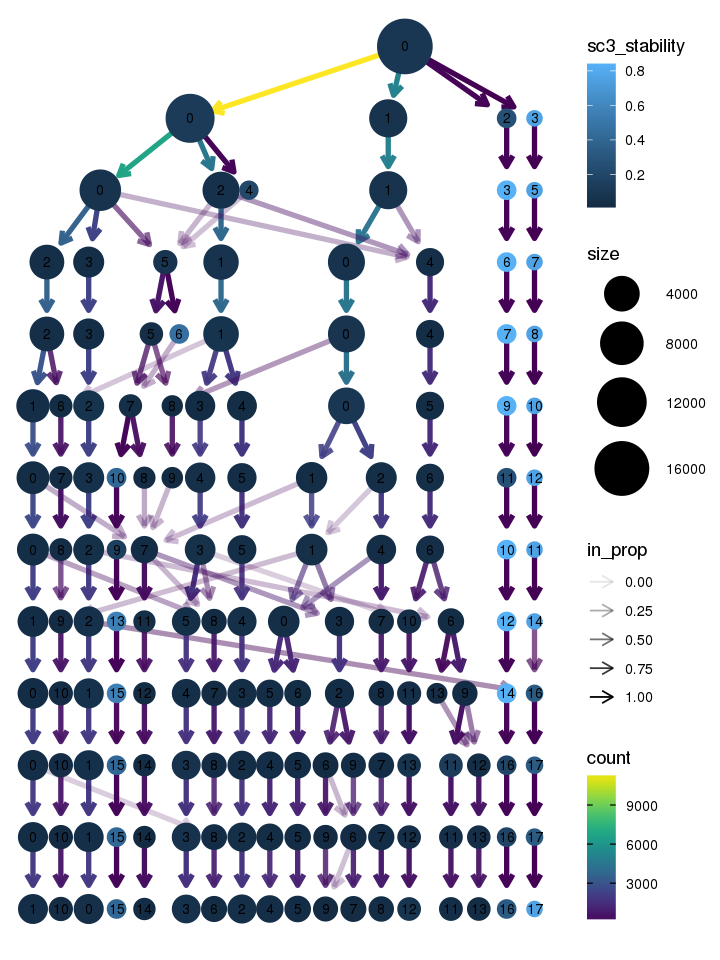

In [33]:
options(repr.plot.width=6, repr.plot.height=8)
clustree(scdata, node_colour = "sc3_stability")

In [34]:
# 用來算clustree每一層也就是分幾群的時候分數最高 
# :: 是用來找一個package下的某個function, :::是用來找一個package下的某個隱藏function
tmp <- clustree:::calc_sc3_stability(scdata[[]][,13:26])
# 標準差 / 平均值 / 變異係數
data.frame(tmp) %>% group_by(resolution) %>% summarise(sum(stability),sd(stability),mean(stability),sd(stability)/mean(stability)) 

resolution,sum(stability),sd(stability),mean(stability),sd(stability)/mean(stability)
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.08940398,NA,0.08940398,NA
2,1.20867917,0.3267134,0.30216979,1.081225
3,2.01661519,0.3753828,0.33610253,1.116870
4,1.93289462,0.3541390,0.24161183,1.465736
5,2.40155848,0.3447677,0.26683983,1.292040
6,1.96732211,0.3150782,0.17884746,1.761715
7,1.80254962,0.2295646,0.13865766,1.655621
8,2.08486169,0.3014769,0.17373847,1.735234
9,2.58154384,0.2975511,0.17210292,1.728914


In [46]:
pc <- 12
scdata <- FindNeighbors(object = scdata, reduction = "pca", dims = 1:pc)
scdata <- FindClusters(scdata, resolution = 0.6)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16707
Number of edges: 463611

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8036
Number of communities: 13
Elapsed time: 2 seconds


In [47]:
reduction_name <- "res0.6"
scdata <- RunUMAP(scdata, reduction = "pca",reduction.name = paste0("umap_", reduction_name, '_pc'), dims = 1:pc)
scdata <- RunTSNE(scdata, reduction = "pca", reduction.name = paste0("tsne_", reduction_name, '_pc'), dims = 1:pc, max_iter = 2000)

02:34:35 UMAP embedding parameters a = 0.9922 b = 1.112

02:34:35 Read 16707 rows and found 12 numeric columns

02:34:35 Using Annoy for neighbor search, n_neighbors = 30

02:34:35 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

02:34:40 Writing NN index file to temp file /tmp/RtmpAhiFZr/file6fe52d51e274

02:34:40 Searching Annoy index using 64 threads, search_k = 3000

02:34:40 Annoy recall = 100%

02:34:42 Commencing smooth kNN distance calibration using 64 threads

02:34:44 Initializing from normalized Laplacian + noise

02:34:44 Commencing optimization for 200 epochs, with 653740 positive edges

02:35:03 Optimization finished

Warning message:
"Cannot add objects with duplicate keys (offending key: UMAP_), setting key to 'umap_res0.6_pc_'"
Warning message:
"Cannot

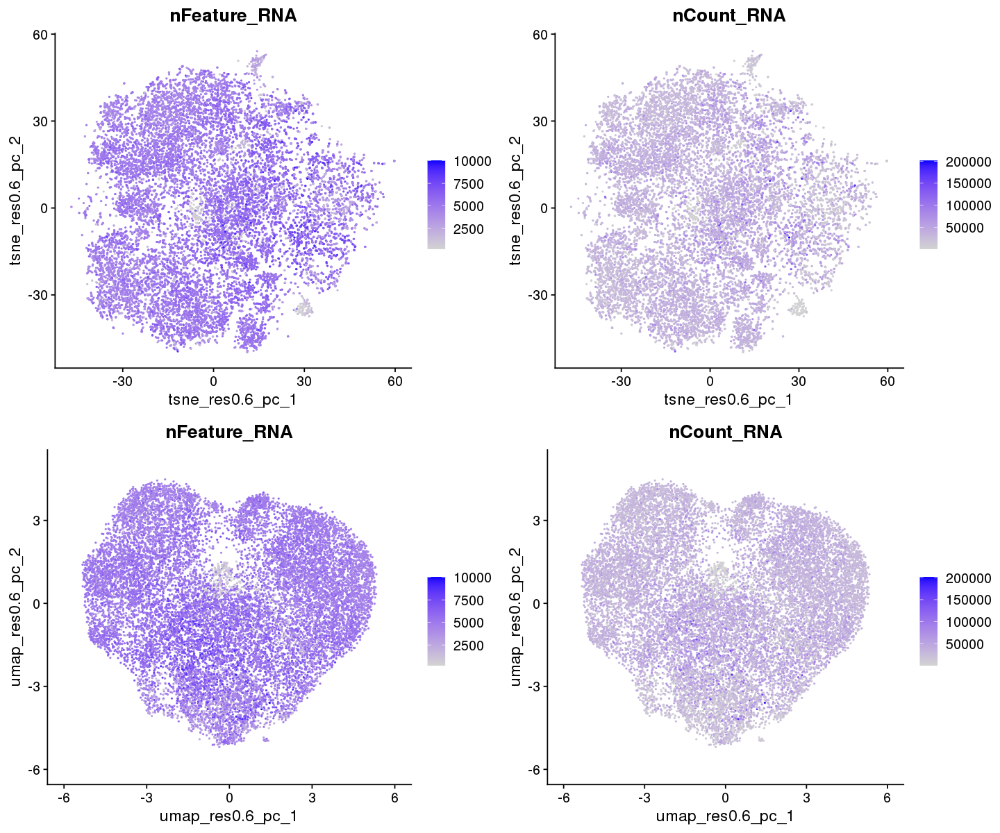

In [48]:
options(repr.plot.width=12, repr.plot.height=10)
fp1 <- FeaturePlot(scdata, features = "nFeature_RNA", pt.size = 0.25, reduction = "tsne_res0.6_pc")
fp2 <- FeaturePlot(scdata, features = "nCount_RNA", pt.size = 0.25, reduction = "tsne_res0.6_pc")
fp3 <- FeaturePlot(scdata, features = "nFeature_RNA", pt.size = 0.25, reduction = "umap_res0.6_pc")
fp4 <- FeaturePlot(scdata, features = "nCount_RNA", pt.size = 0.25, reduction = "umap_res0.6_pc")
plot_grid(fp1, fp2, fp3, fp4, ncol = 2, nrow = 2)

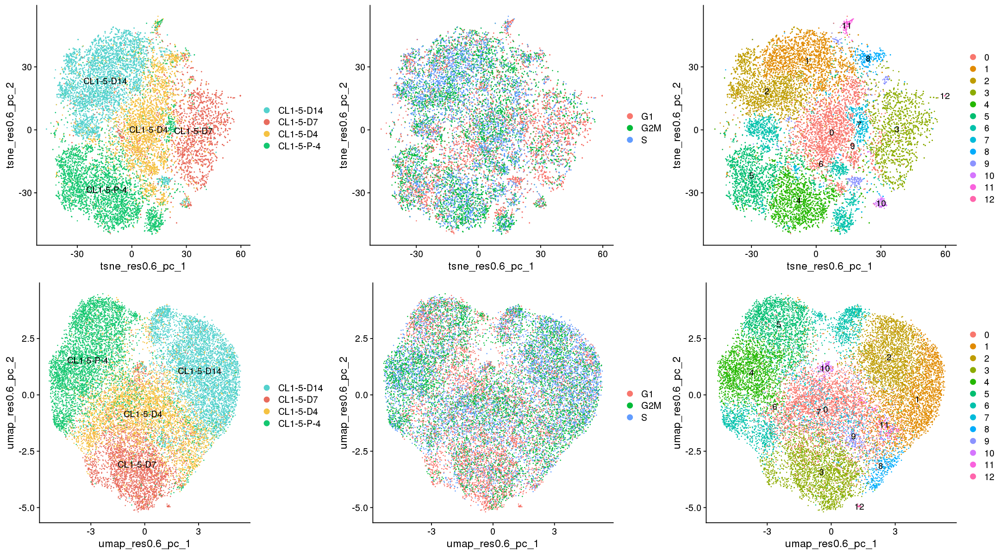

In [49]:
options(repr.plot.width=18, repr.plot.height=10)
tp1 <- DimPlot(object = scdata, reduction = "tsne_res0.6_pc", group.by = "condition", order = order_list, label = TRUE, cols = color_style)
tp2 <- DimPlot(object = scdata, reduction = "tsne_res0.6_pc", group.by = "Phase")
tp3 <- DimPlot(object = scdata, reduction = "tsne_res0.6_pc", label = TRUE)
up1 <- DimPlot(object = scdata, reduction = "umap_res0.6_pc", group.by = "condition", order = order_list, label = TRUE, cols = color_style)
up2 <- DimPlot(object = scdata, reduction = "umap_res0.6_pc", group.by = "Phase")
up3 <- DimPlot(object = scdata, reduction = "umap_res0.6_pc", label = TRUE)
plot_grid(tp1, tp2, tp3,up1, up2, up3, ncol=3)

In [50]:
plot.data <- scdata@meta.data %>%
    select(condition, cluster = logCPM_snn_res.0.6) %>%
    mutate(cluster = factor(cluster)) %>%
    mutate(condition = factor(condition, levels = order_list))%>%
    group_by(cluster, condition) %>%
    summarise(count = n()) %>%
    mutate(clust_total = sum(count)) %>%
    mutate(clust_prop = count / clust_total) %>%
    group_by(condition) %>%
    mutate(dataset_total = sum(count)) %>%
    ungroup() %>%
    mutate(dataset_prop = count / dataset_total)

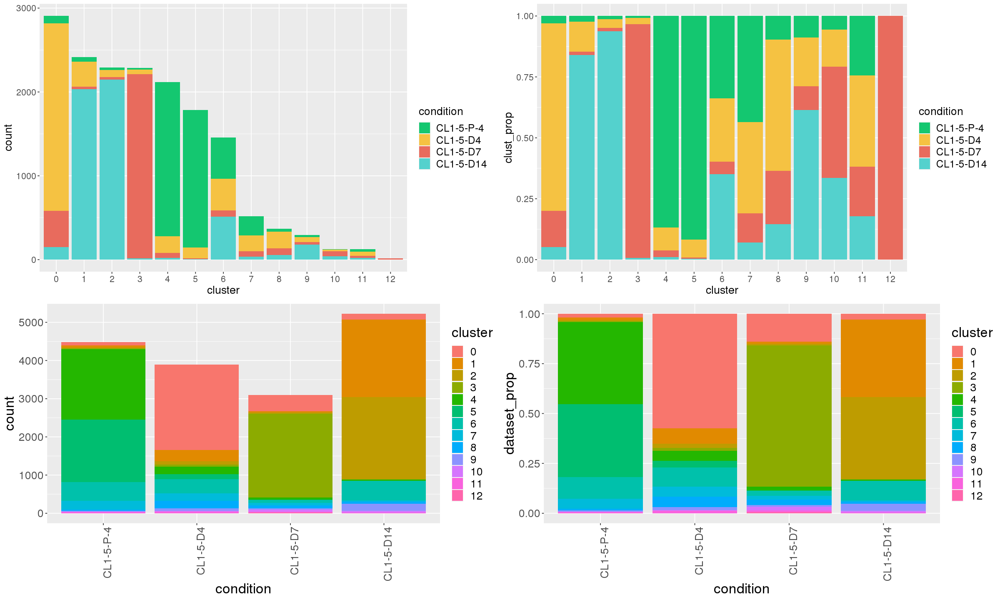

In [51]:
options(repr.plot.width=20, repr.plot.height=12)

gp1<-ggplot(plot.data, aes(x = cluster, y = count, fill = condition)) +
    geom_col()+
    scale_fill_manual(values = color_style)+
    theme(legend.text=element_text(size=15), text = element_text(size = 16))

gp2<-ggplot(plot.data, aes(x = cluster, y = clust_prop, fill = condition)) +
    geom_col()+
    scale_fill_manual(values = color_style)+
    theme(legend.text=element_text(size=15), text = element_text(size = 16))

gp3<-ggplot(plot.data, aes(x = condition, y = count, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

gp4<-ggplot(plot.data, aes(x = condition, y = dataset_prop, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

plot_grid(gp1, gp2, gp3, gp4, ncol = 2)

In [52]:
saveRDS(file ="/mnt/isilonX200/scRNA/Project_1/Result/CL15.merge.noc.Rds", object = scdata)

<h2>7.Different Expression</h>

In [53]:
# Idents(scdata) <- scdata@meta.data$logCPM_snn_res.0.6
scdata.markers <- FindAllMarkers(object = scdata, features = VariableFeatures(scdata)) 
top20 = scdata.markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12



In [54]:
head(top20)

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
8.041051e-277,0.3545812,0.645,0.300,1.536002e-272,0,MT1E
2.624028e-237,-0.3584251,0.996,0.999,5.012417e-233,0,S100A6
1.560502e-236,-0.2904509,0.992,0.999,2.980872e-232,0,LGALS1
1.141149e-201,0.2801066,0.576,0.297,2.179824e-197,0,KRT19
1.936701e-174,-0.3034743,0.868,0.920,3.699487e-170,0,PLAUR
2.936678e-145,-0.2620426,0.869,0.909,5.609643e-141,0,SLC16A3


In [55]:
MinMax <- function(data, min, max) {
  data2 <- data
  data2[data2 > max] <- max
  data2[data2 < min] <- min
  return(data2)
}

plot_heatmap <- as.data.frame(x = t(as.matrix(x = t(x = GetAssayData(
    object = scdata,
    slot = 'scale.data')[top20$gene ,cells <- colnames(x = scdata)]))))

annotation_col <- scdata@meta.data[,c("condition", "logCPM_snn_res.0.6"), drop = FALSE]
annotation_col <- annotation_col[order(annotation_col$condition, annotation_col$logCPM_snn_res.0.6),]
plot_heatmap <- plot_heatmap[,rownames(annotation_col)]
plot_heatmap <- MinMax(plot_heatmap,-3.5,3.5)
aka3 = list(condition = color_style)

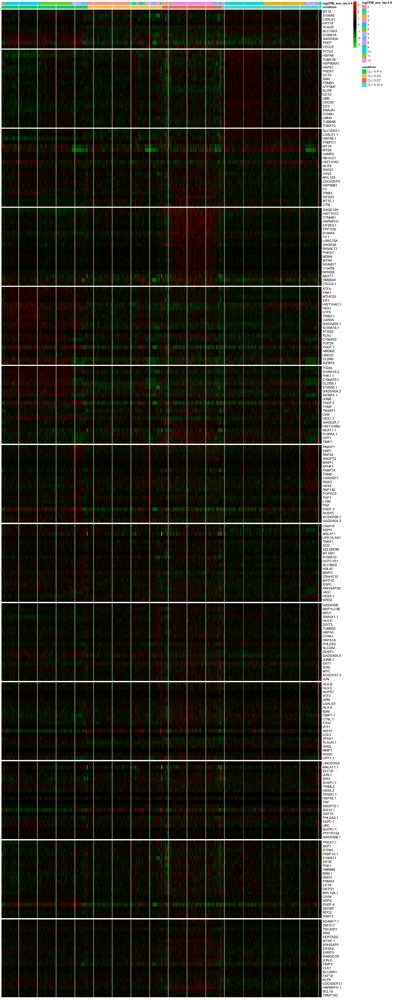

In [56]:
options(repr.plot.width = 18, repr.plot.height = 45)
pheatmap(plot_heatmap,
         annotation_col = annotation_col,
         annotation_colors = aka3[1],
         cluster_rows = FALSE, 
         cluster_cols = FALSE,
         show_colnames = FALSE,
         gaps_row = cumsum(table(top20$cluster)),
         gaps_col = cumsum(table(annotation_col$seurat_clusters)),
         color = greenred(100),
         fontsize_row=11
         )

<h2>8.Pesudotime Analysis</h2>

In [57]:
# scdata <- readRDS(file ="/mnt/isilonX200/scRNA/Project_1/Result/CL15.merge.noc.Rds")

In [58]:
data <- as(as.matrix(scdata@assays$logCPM@counts), 'sparseMatrix')
pd <- new('AnnotatedDataFrame', data = scdata@meta.data)
fData <- data.frame(gene_short_name = row.names(data), row.names = row.names(data))
fd <- new('AnnotatedDataFrame', data = fData)
#Construct monocle cds
monocle_cds <- newCellDataSet(data,
                              phenoData = pd,
                              featureData = fd,
                              lowerDetectionLimit = 0.5,
                              expressionFamily = negbinomial.size())

In [59]:
CL10.M <- monocle_cds
CL10.M <- estimateSizeFactors(CL10.M)
CL10.M <- estimateDispersions(CL10.M)

Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message:
"glm.fit: algorithm did not converge"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message in log(ife

In [60]:
CL10.M <- detectGenes(CL10.M, min_expr = 3 )

In [61]:
# saveRDS(file="/mnt/isilonX200/scRNA/Project_1/Result/CL15.nocc.monocle.Rds", object = CL10.M)
# CL10.M <- readRDS(file="/mnt/isilonX200/scRNA/Project_1/Result/CL15.nocc.monocle.Rds")

In [62]:
str(CL10.M)

Formal class 'CellDataSet' [package "monocle"] with 19 slots
  ..@ reducedDimS          : num[0 , 0 ] 
  ..@ reducedDimW          : num[0 , 0 ] 
  ..@ reducedDimA          : num[0 , 0 ] 
  ..@ reducedDimK          : num[0 , 0 ] 
  ..@ minSpanningTree      :Formal class 'igraph' [package "monocle"] with 1 slot
  .. .. ..@ .S3Class: chr "igraph"
  ..@ cellPairwiseDistances: num[0 , 0 ] 
  ..@ expressionFamily     :Formal class 'vglmff' [package "VGAM"] with 22 slots
  .. .. ..@ blurb             : chr [1:6] "Negative-binomial distribution with size known\n\n" "Links:    " "loglink(mu)" "\n" ...
  .. .. ..@ constraints       :  expression({  constraints <- cm.zero.VGAM(constraints, x = x, NULL, M = M, predictors.names = predictors.names,  M1 = 2) })
  .. .. ..@ deviance          :function ()  
  .. .. ..@ fini              :  expression({ })
  .. .. ..@ first             :  expression({ })
  .. .. ..@ infos             :function (...)  
  .. .. ..@ initialize        :  expression({  M1 <-

In [63]:
head(fData(CL10.M)[order(-fData(CL10.M)$num_cells_expressed),])

,gene_short_name,num_cells_expressed
,<fct>,<int>
RPS18,RPS18,16687
RPS19,RPS19,16652
RPS27A,RPS27A,16651
RPL12,RPL12,16645
TMSB10,TMSB10,16643
RPL13,RPL13,16623


In [64]:
expressed_genes <- rownames(subset(fData(CL10.M), num_cells_expressed >= 10))
head(expressed_genes)

[1] "NOC2L"    "HES4"     "ISG15"    "AGRN"     "C1orf159" "SDF4"

In [65]:
print(head(pData(CL10.M)[,c(0:5)]))

                             orig.ident nCount_RNA nFeature_RNA condition
AAACCTGAGTGTACTC-1-CL1-5-P-4  Project_1      30550         4767 CL1-5-P-4
AAACCTGCAATTGCTG-1-CL1-5-P-4  Project_1      32269         4845 CL1-5-P-4
AAACCTGCACCTGGTG-1-CL1-5-P-4  Project_1      28982         4586 CL1-5-P-4
AAACCTGGTAGGGACT-1-CL1-5-P-4  Project_1      35768         5115 CL1-5-P-4
AAACCTGGTCACTGGC-1-CL1-5-P-4  Project_1      58323         6178 CL1-5-P-4
AAACCTGGTGCCTGCA-1-CL1-5-P-4  Project_1      30449         4830 CL1-5-P-4
                             percent.MT
AAACCTGAGTGTACTC-1-CL1-5-P-4   3.521980
AAACCTGCAATTGCTG-1-CL1-5-P-4   2.717779
AAACCTGCACCTGGTG-1-CL1-5-P-4   2.235871
AAACCTGGTAGGGACT-1-CL1-5-P-4   3.351784
AAACCTGGTCACTGGC-1-CL1-5-P-4   2.839311
AAACCTGGTGCCTGCA-1-CL1-5-P-4   4.016157


In [66]:
diff_test_res <- differentialGeneTest(CL10.M, fullModelFormulaStr = "~logCPM_snn_res.0.6") 

In [67]:
head(diff_test_res)
ordering_genes <- row.names (subset(diff_test_res, qval < 0.01))
head(ordering_genes)

,status,family,pval,qval,gene_short_name,num_cells_expressed
,<fct>,<fct>,<dbl>,<dbl>,<fct>,<int>
AL627309.1,OK,negbinomial.size,2.758699e-01,3.244869e-01,AL627309.1,0
AL669831.5,OK,negbinomial.size,1.022555e-18,2.712894e-18,AL669831.5,1
LINC00115,OK,negbinomial.size,5.420682e-09,1.007354e-08,LINC00115,1
FAM41C,OK,negbinomial.size,7.893293e-01,8.353335e-01,FAM41C,0
AL645608.3,OK,negbinomial.size,7.332998e-01,7.848654e-01,AL645608.3,0
SAMD11,OK,negbinomial.size,2.879074e-07,4.945690e-07,SAMD11,1


[1] "AL669831.5" "LINC00115"  "SAMD11"     "NOC2L"      "KLHL17"    
[6] "PLEKHN1"

In [68]:
CL10.M <- setOrderingFilter(CL10.M, rownames(CL10.M))

In [69]:
CL10.M.order <- setOrderingFilter(CL10.M, ordering_genes)

In [70]:
print(paste0(length(rownames(CL10.M)), "=>", length(rownames(CL10.M[setdiff(rownames(CL10.M), ordering_genes),])), "=>", length(rownames(CL10.M[ordering_genes,]))))

[1] "19102=>5011=>14091"


Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"


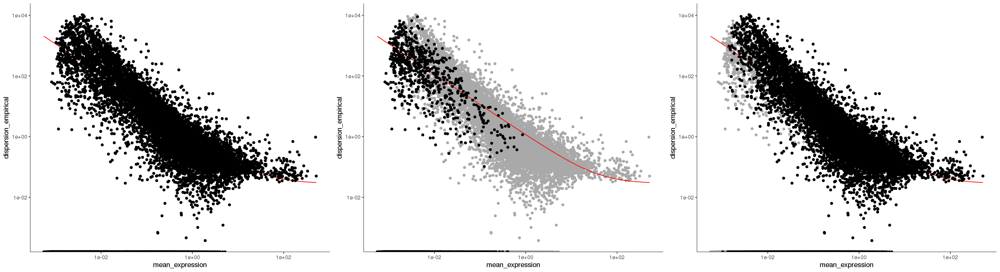

In [71]:
options(repr.plot.width=22, repr.plot.height=6)
pog1 <- plot_ordering_genes(CL10.M)
pog2 <- plot_ordering_genes(CL10.M[setdiff(rownames(CL10.M), ordering_genes),])
pog3 <- plot_ordering_genes(CL10.M.order)
plot_grid(pog1, pog2, pog3, ncol=3)

In [72]:
str(CL10.M)

Formal class 'CellDataSet' [package "monocle"] with 19 slots
  ..@ reducedDimS          : num[0 , 0 ] 
  ..@ reducedDimW          : num[0 , 0 ] 
  ..@ reducedDimA          : num[0 , 0 ] 
  ..@ reducedDimK          : num[0 , 0 ] 
  ..@ minSpanningTree      :Formal class 'igraph' [package "monocle"] with 1 slot
  .. .. ..@ .S3Class: chr "igraph"
  ..@ cellPairwiseDistances: num[0 , 0 ] 
  ..@ expressionFamily     :Formal class 'vglmff' [package "VGAM"] with 22 slots
  .. .. ..@ blurb             : chr [1:6] "Negative-binomial distribution with size known\n\n" "Links:    " "loglink(mu)" "\n" ...
  .. .. ..@ constraints       :  expression({  constraints <- cm.zero.VGAM(constraints, x = x, NULL, M = M, predictors.names = predictors.names,  M1 = 2) })
  .. .. ..@ deviance          :function ()  
  .. .. ..@ fini              :  expression({ })
  .. .. ..@ first             :  expression({ })
  .. .. ..@ infos             :function (...)  
  .. .. ..@ initialize        :  expression({  M1 <-

In [73]:
CL10.M.order <- reduceDimension(CL10.M.order, max_components = 2, reduction_method = "DDRTree")
CL10.M.order <- orderCells(CL10.M.order)

In [74]:
length(rownames(pData(CL10.M.order)))

[1] 16707

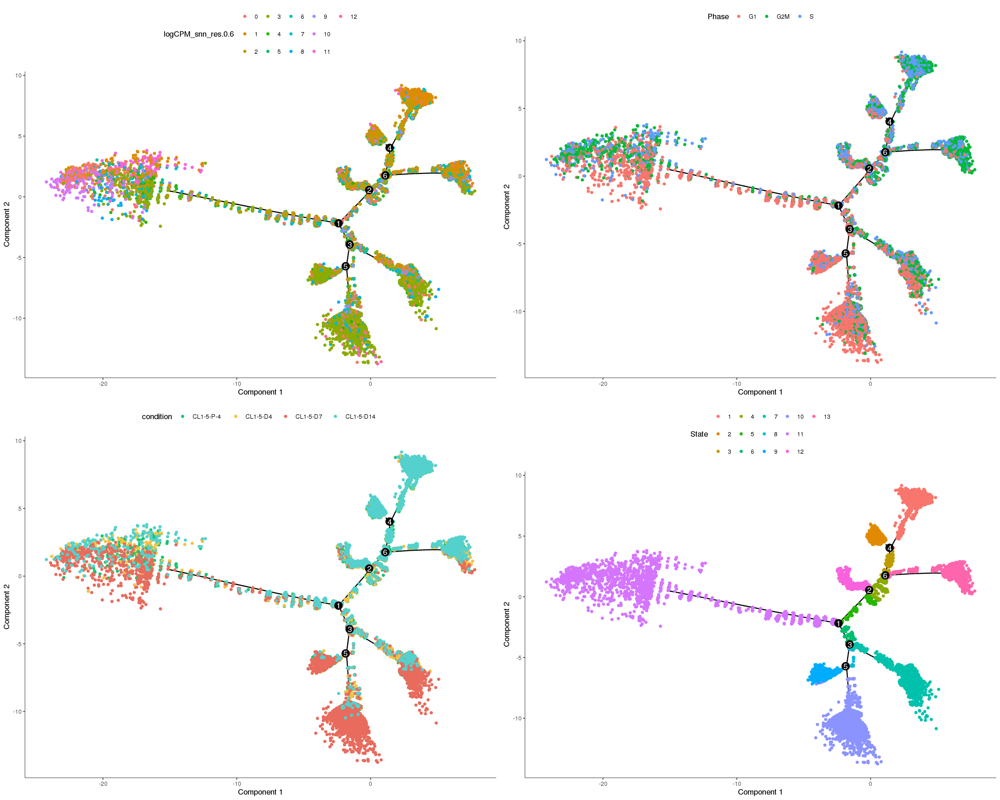

In [75]:
options(repr.plot.width=20, repr.plot.height=16)
trajectoryplot1 <- plot_cell_trajectory(CL10.M.order, color_by = "logCPM_snn_res.0.6")
trajectoryplot2 <- plot_cell_trajectory(CL10.M.order, color_by = "Phase")
trajectoryplot3 <- plot_cell_trajectory(CL10.M.order, color_by = "condition") + 
                   scale_color_manual(values = color_style, breaks = order_list)
trajectoryplot4 <- plot_cell_trajectory(CL10.M.order, color_by = "State", order = order_list, cols = color_style)
plot_grid(trajectoryplot1, trajectoryplot2, trajectoryplot3, trajectoryplot4, ncol=2)

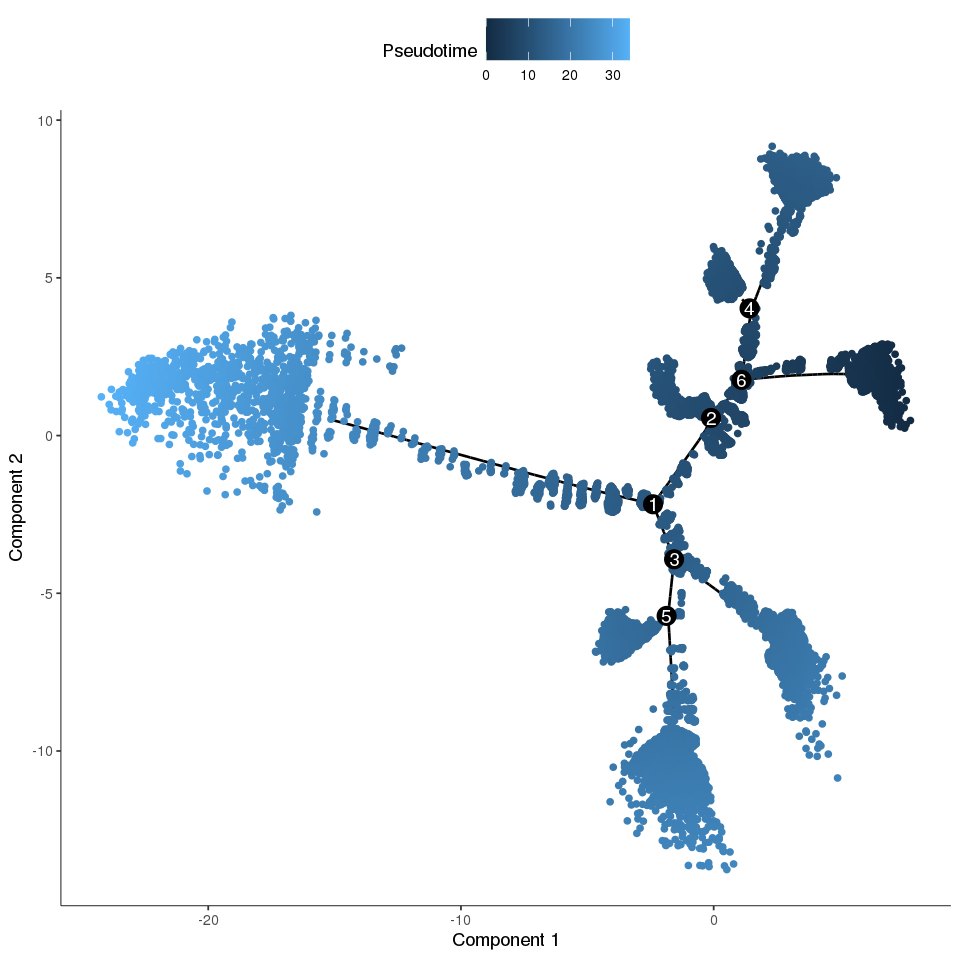

In [76]:
options(repr.plot.width=8, repr.plot.height=8)
GM_state <- function(CL10.M.order){
  if (length(unique(pData(CL10.M.order)$State)) > 1){
    T0_counts <- table(pData(CL10.M.order)$State, pData(CL10.M.order)$seurat_clusters)[,"0"]
    return(as.numeric(names(T0_counts)[which(T0_counts == max(T0_counts))]))
  } else {
    return (1)
  }
}
CL10.M.order <- orderCells(CL10.M.order, root_state = GM_state(CL10.M.order))
plot_cell_trajectory(CL10.M.order, color_by = "Pseudotime")

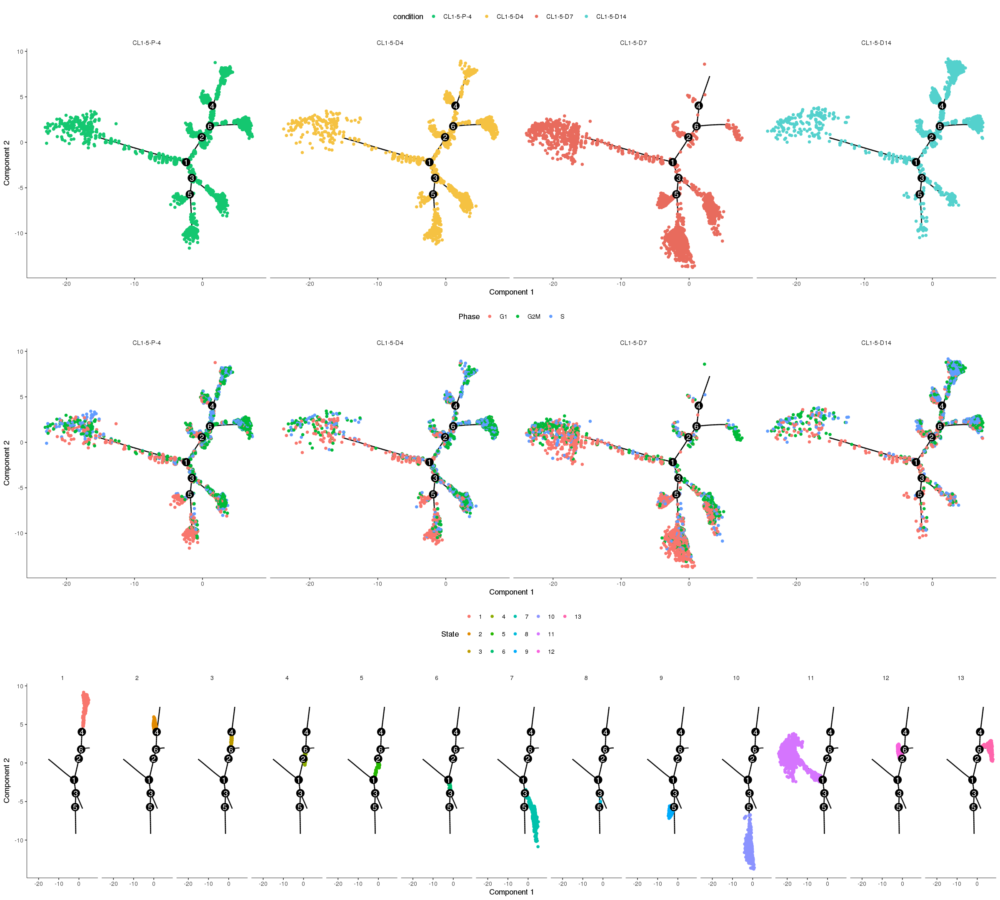

In [77]:
CL10.M.order@phenoData@data$condition<-factor(CL10.M.order@phenoData@data$condition, levels = order_list)
options(repr.plot.width=20, repr.plot.height=18)
facet.trajectory.plot1 <- plot_cell_trajectory(CL10.M.order, color_by = "condition")+
                          scale_color_manual(values = color_style, breaks = order_list)+
                          facet_wrap(~condition, nrow = 1)
facet.trajectory.plot2 <- plot_cell_trajectory(CL10.M.order, color_by = "Phase")+
                          facet_wrap(~condition, nrow = 1)
facet.trajectory.plot3 <- plot_cell_trajectory(CL10.M.order, color_by = "State") +
                          facet_wrap(~State, nrow = 1)
plot_grid(facet.trajectory.plot1, facet.trajectory.plot2, facet.trajectory.plot3, ncol=1)

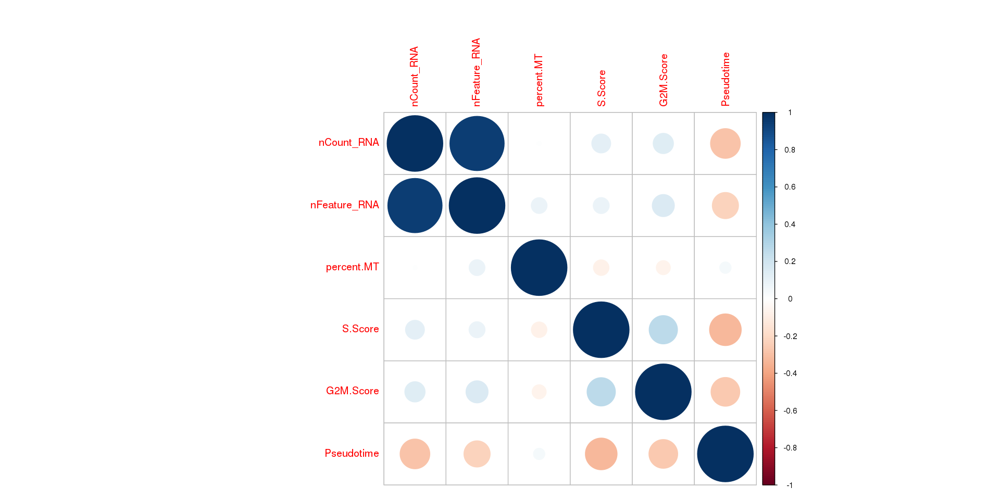

In [78]:
options(repr.plot.width = 16, repr.plot.height = 8)
cor.meta <- cor(CL10.M.order@phenoData@data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score', "Pseudotime")], CL10.M.order@phenoData@data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score', "Pseudotime")], method = 'spear')
corrplot(cor.meta, method = "circle")

In [79]:
head(CL10.M.order@phenoData@data)

,orig.ident,nCount_RNA,nFeature_RNA,condition,percent.MT,nCount_logCPM,nFeature_logCPM,S.Score,G2M.Score,Phase,...,logCPM_snn_res.0.8,logCPM_snn_res.0.9,logCPM_snn_res.1,logCPM_snn_res.1.1,logCPM_snn_res.1.2,seurat_clusters,Size_Factor,num_genes_expressed,Pseudotime,State
,<chr>,<dbl>,<int>,<ord>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<fct>,...,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<dbl>,<int>,<dbl>,<fct>
AAACCTGAGTGTACTC-1-CL1-5-P-4,Project_1,30550,4767,CL1-5-P-4,3.521980,30550,4767,-0.11837637,-0.32486084,G1,...,10,11,13,12,12,6,1.0365118,1175,12.332316,11
AAACCTGCAATTGCTG-1-CL1-5-P-4,Project_1,32269,4845,CL1-5-P-4,2.717779,32269,4845,-0.02128116,0.29019603,G2M,...,5,4,3,3,3,4,1.0948347,1238,8.641640,12
AAACCTGCACCTGGTG-1-CL1-5-P-4,Project_1,28982,4586,CL1-5-P-4,2.235871,28982,4586,-0.08761361,-0.15206221,G1,...,4,3,2,2,2,5,0.9833121,1144,7.548487,3
AAACCTGGTAGGGACT-1-CL1-5-P-4,Project_1,35768,5115,CL1-5-P-4,3.351784,35768,5115,0.12985950,-0.01364067,S,...,5,4,3,3,3,4,1.2135500,1423,9.055406,5
AAACCTGGTCACTGGC-1-CL1-5-P-4,Project_1,58323,6178,CL1-5-P-4,2.839311,58323,6178,0.06562896,0.31463233,G2M,...,9,10,10,10,10,7,1.9788045,2146,1.907902,13
AAACCTGGTGCCTGCA-1-CL1-5-P-4,Project_1,30449,4830,CL1-5-P-4,4.016157,30449,4830,0.11428975,-0.01317084,S,...,8,7,8,8,6,4,1.0330850,1192,7.738575,4
